The first and most critical step in our environment setup is to confirm the presence of a Graphics Processing Unit (GPU). The !nvidia-smi command is used to query the NVIDIA driver, which detects and reports the status of all available NVIDIA GPUs in the system.


Why this is essential: Deep learning models, like the one we are training, are computationally intensive and involve processing millions of simple, repetitive mathematical operations.

*   A CPU (Central Processing Unit) is optimized for handling a few complex, sequential tasks at once.
*   A GPU (Graphics Processing Unit), in contrast, is a highly parallel processor designed to execute thousands of simple, repetitive tasks simultaneously.

This parallel architecture makes a GPU thousands of times faster for training AI models than a CPU. Running this command ensures that Colab has allocated a high-performance accelerator (like a Tesla T4) to our session, which is essential for training our model in a feasible amount of time

In [ ]:
#@title 1.1: Check GPU Availability
print("--- Checking GPU ---")
!nvidia-smi

--- Checking GPU ---
/bin/bash: line 1: nvidia-smi: command not found


With our GPU environment confirmed, the next step is to install the core software toolkit for our project.

We use **pip**, which is the standard Python package manager (similar to an "app store" for Python code), to install ultralytics.

The ultralytics library is a powerful, one-stop-shop toolkit that contains everything we need to build, train, and deploy YOLO (You Only Look Once) models. YOLO is a state-of-the-art, high-speed object detection architecture, making it perfect for our goal of finding armyworms in real-time.

By installing this single library, we gain access to:
*   Pre-built Models: The yolov11s.pt "blueprints" we will use for Transfer Learning.
*   Training Engine: The simple ***model.train()*** function that does all the heavy lifting.
*   Export Tools: The ***model.export()*** function required to package our final model into the .onnx format



In [ ]:
#@title 1.2: Install Ultralytics

print("--- Installing Ultralytics ---")
!pip install -q ultralytics
print("✅ Ultralytics installed.")

--- Installing Ultralytics ---
✅ Ultralytics installed.


In [ ]:
#@title 1.3: Verify Ultralytics Installation

import ultralytics
print("--- Running Ultralytics Checks ---")
ultralytics.checks()

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.1/107.7 GB disk)


This step is critical for ensuring our work persists. The Google Colab runtime is an ephemeral, or temporary, environment. Any files we download, libraries we install, or models we train will be permanently deleted when the session is closed or times out.


Our Google Drive, in contrast, serves as our permanent, personal storage solution.

The ***drive.mount('/content/drive')*** command builds a secure connection between this temporary Colab environment and our permanent Google Drive file system. This makes our Drive accessible as a local folder (/content/drive), allowing us to save our crucial outputs—like training logs, model checkpoints, and the final exported .onnx file—safely and permanently.

In [ ]:
#@title 1.4: Mount Google Drive

from google.colab import drive
import os

print("--- Mounting Google Drive ---")
if os.path.exists('/content/drive'):
    !rm -rf /content/drive/*
drive.mount('/content/drive', force_remount=True)
print("✅ Google Drive mounted.")

--- Mounting Google Drive ---
Mounted at /content/drive
✅ Google Drive mounted.


Now that our Google Drive is mounted, we establish a clean, organized folder structure within it. This is a critical step for automated and reproducible results.

We create a main project folder ***(FAW_Capstone_YOLO(11-4s))*** and, most importantly, a runs subfolder.


**Why this is smart:**
When we begin training our model later, we will simply point the Ultralytics toolkit to this runs directory. The toolkit will then automatically handle all file management, creating a new, timestamped subfolder for each training experiment ***(e.g., yolov11s_faw_final_1class_run)***.

All our essential outputs—training charts, confusion matrices, and the final best.pt and last.pt model checkpoint files will be saved neatly in one organized, permanent location. The exist_ok=True parameter simply ensures the command doesn't error if these folders already exist.

In [ ]:
#@title 1.5: Create Project Folders in Google Drive
import os

GDRIVE_PROJECT_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)"
DATASET_DIR_GDRIVE = os.path.join(GDRIVE_PROJECT_PATH, "datasets")
RUNS_DIR_GDRIVE = os.path.join(GDRIVE_PROJECT_PATH, "runs")
os.makedirs(DATASET_DIR_GDRIVE, exist_ok=True)
os.makedirs(RUNS_DIR_GDRIVE, exist_ok=True)

print(f"--- Project folders created/verified in Google Drive ---")
print(f"Base Project Path: {GDRIVE_PROJECT_PATH}")
print(f"Dataset Path:      {DATASET_DIR_GDRIVE}")
print(f"Training Runs Path:{RUNS_DIR_GDRIVE}")
!ls -l {GDRIVE_PROJECT_PATH}

--- Project folders created/verified in Google Drive ---
Base Project Path: /content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)
Dataset Path:      /content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/datasets
Training Runs Path:/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/runs
/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `ls -l /content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)'


This code block uses the ***!git clone*** command  to download the complete FAW_YOLO_dataset repository from its host on GitHub. The data is downloaded from the internet directly onto the temporary Colab runtime's local hard drive, into the ***/content/FAW_Capstone_Project(Group AI)*** directory.


This is a key optimization step. Training a model by reading thousands of files from the local Colab disk is significantly faster than reading them one-by-one from a mounted Google Drive.

This command provides us with the raw train and validation folders, which contain all the original .jpg images and, most importantly, the "messy" .xml annotation files that we will process in the next steps. The if os.path.exists... logic simply ensures we start with a fresh, clean copy of the data each time the notebook is run.

In [ ]:
#@title 2.1: Clone Data from GitHub

GITHUB_URL = "https://github.com/Ore87/FAW_Capstone_Project_-Group-AI-.git"
CLONE_PATH = "/content/FAW_YOLO_dataset"

!echo "--- Cloning repository... ---"

import os
if os.path.exists(CLONE_PATH):
  !rm -rf {CLONE_PATH}
  print(f"Removed existing directory: {CLONE_PATH}")
!git clone --depth 1 {GITHUB_URL} {CLONE_PATH}

!echo "\n--- Verifying contents (should show FAW_dataset folder): ---"
!ls -l {CLONE_PATH}
!echo "\n--- Contents of FAW_dataset folder: ---"
!ls -l {CLONE_PATH}/FAW_dataset

--- Cloning repository... ---
Cloning into '/content/FAW_YOLO_dataset'...
remote: Enumerating objects: 24428, done.
remote: Counting objects: 100% (24428/24428), done.
remote: Compressing objects: 100% (11926/11926), done.
remote: Total 24428 (delta 12502), reused 24428 (delta 12502), pack-reused 0 (from 0)
Receiving objects: 100% (24428/24428), 761.82 MiB | 38.51 MiB/s, done.
Resolving deltas: 100% (12502/12502), done.
Updating files: 100% (26251/26251), done.
\n--- Verifying contents (should show FAW_dataset folder): ---
total 2508
drwxr-xr-x 2 root root    4096 Nov  6 09:15 test
drwxr-xr-x 2 root root 2187264 Nov  6 09:15 train
drwxr-xr-x 2 root root  368640 Nov  6 09:15 validation
\n--- Contents of FAW_dataset folder: ---
ls: cannot access '/content/FAW_YOLO_dataset/FAW_dataset': No such file or directory


Using the ***os and glob libraries***, this script systematically scans the train, validation, and test directories.

For the train and validation folders, it counts the total number of image files ***(.jpg, .jpeg, .png)*** and the total number of annotation files ***(.xml).*** The goal is to ensure that these two numbers match, confirming that every image has a corresponding annotation file. The output of this step confirms our starting point of ***11,222*** training pairs and ***1,889*** validation pairs.

For the test folder, it counts the number of video files, ensuring our unseen data for the final validation step has been correctly downloaded.

In [ ]:
#@title Count Files in Cloned Dataset

import os
import glob

DATASET_BASE_PATH = "/content/FAW_YOLO_dataset/"

train_path = os.path.join(DATASET_BASE_PATH, 'train')
val_path = os.path.join(DATASET_BASE_PATH, 'validation')
test_path = os.path.join(DATASET_BASE_PATH, 'test')

print(f"--- Checking file counts in: {DATASET_BASE_PATH} ---")

if os.path.exists(train_path):
    train_images = glob.glob(os.path.join(train_path, '*.jpg')) + \
                   glob.glob(os.path.join(train_path, '*.jpeg')) + \
                   glob.glob(os.path.join(train_path, '*.png'))
    train_xmls = glob.glob(os.path.join(train_path, '*.xml'))
    print(f"\nTrain Folder ({train_path}):")
    print(f"  Images (.jpg/.jpeg/.png): {len(train_images)}")
    print(f"  Annotations (.xml):      {len(train_xmls)}")
else:
    print(f"\nTrain folder not found at: {train_path}")

if os.path.exists(val_path):
    val_images = glob.glob(os.path.join(val_path, '*.jpg')) + \
                 glob.glob(os.path.join(val_path, '*.jpeg')) + \
                 glob.glob(os.path.join(val_path, '*.png'))
    val_xmls = glob.glob(os.path.join(val_path, '*.xml'))
    print(f"\nValidation Folder ({val_path}):")
    print(f"  Images (.jpg/.jpeg/.png): {len(val_images)}")
    print(f"  Annotations (.xml):      {len(val_xmls)}")
else:
    print(f"\nValidation folder not found at: {val_path}")

if os.path.exists(test_path):

    video_files = glob.glob(os.path.join(test_path, '*.mp4')) + \
                  glob.glob(os.path.join(test_path, '*.avi')) + \
                  glob.glob(os.path.join(test_path, '*.mov'))
    print(f"\nTest Folder ({test_path}):")
    print(f"  Video Files (.mp4/.avi/.mov): {len(video_files)}")
else:
    print(f"\nTest folder not found at: {test_path}")

print("\n--- Count Complete ---")

--- Checking file counts in: /content/FAW_YOLO_dataset/ ---

Train Folder (/content/FAW_YOLO_dataset/train):
  Images (.jpg/.jpeg/.png): 11235
  Annotations (.xml):      11232

Validation Folder (/content/FAW_YOLO_dataset/validation):
  Images (.jpg/.jpeg/.png): 1889
  Annotations (.xml):      1889

Test Folder (/content/FAW_YOLO_dataset/test):
  Video Files (.mp4/.avi/.mov): 5

--- Count Complete ---


After confirming the file counts, this script performs our first qualitative data inspection. It is not enough to know that the files exist; we must visually confirm what is inside them before proceeding with any processing.

This code block performs the following actions:

It randomly selects a sample of .xml annotation files from our raw training dataset.

For each XML file, it parses the data to find the corresponding image file.

It reads the original, "messy" class names ***(e.g., 'Fall-Armyworm', 'Cabbage-worm', 'Plaga' )*** and bounding box pixel coordinates from the XML.

It uses cv2 ***(OpenCV)*** to draw these boxes and labels directly onto the image.

Finally, it displays the annotated images using matplotlib.

This is a critical diagnostic step. It provides the first visual evidence of the *"23-label mess"*, allowing us to see the inconsistent, incorrect, and redundant labels in their original context. This visual confirmation is what justifies the comprehensive data-cleaning strategy we will execute in the following phases.

--- Visualizing Random Samples from Cloned Dataset ---
Found 11232 XML files. Picking 4 random samples...


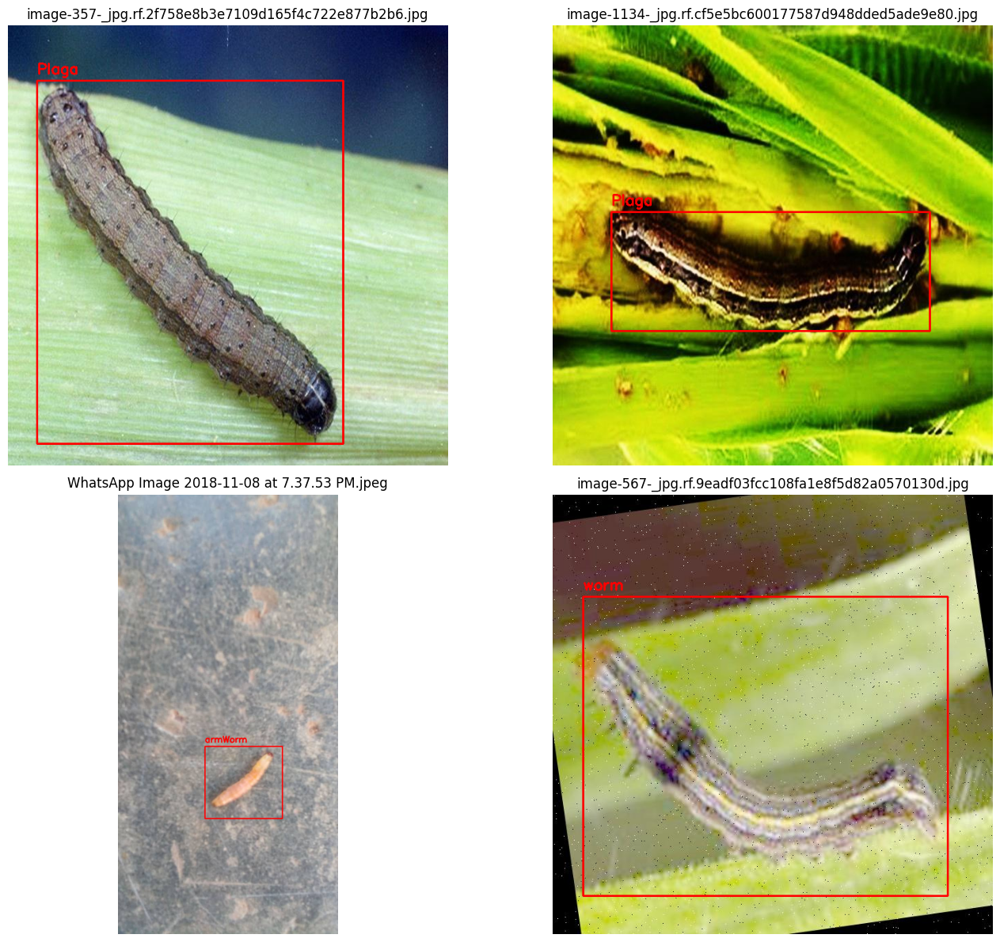

In [ ]:
#@title Visualize Random Dataset Samples (from original XMLs)

import os
import glob
import random
import xml.etree.ElementTree as ET
import cv2
import matplotlib.pyplot as plt

print("--- Visualizing Random Samples from Cloned Dataset ---")

DATASET_BASE_PATH = "/content/FAW_YOLO_dataset"
TRAIN_FOLDER_PATH = os.path.join(DATASET_BASE_PATH, "train")
NUM_IMAGES_TO_SHOW = 4
xml_files = glob.glob(os.path.join(TRAIN_FOLDER_PATH, "*.xml"))

if not xml_files:
    print(f"ERROR: No XML files found in {TRAIN_FOLDER_PATH}")
    print("   Please make sure you have run the data cloning step (Cell 2.1) correctly.")
else:
    print(f"Found {len(xml_files)} XML files. Picking {NUM_IMAGES_TO_SHOW} random samples...")


    fig_cols = 2
    fig_rows = (NUM_IMAGES_TO_SHOW + fig_cols - 1) // fig_cols
    plt.figure(figsize=(15, 6 * fig_rows))
    random_samples = random.sample(xml_files, min(len(xml_files), NUM_IMAGES_TO_SHOW))

    for i, xml_file in enumerate(random_samples):
        try:
            tree = ET.parse(xml_file)
            root = tree.getroot()
            filename_node = root.find('filename')

            if filename_node is not None:
                image_name = filename_node.text
            else:
                base_name = os.path.splitext(os.path.basename(xml_file))[0]
                image_name = base_name + '.jpg'

            image_path = os.path.join(TRAIN_FOLDER_PATH, image_name)

            if not os.path.exists(image_path):
                base_image_path = os.path.join(TRAIN_FOLDER_PATH, os.path.splitext(image_name)[0])
                for ext in ['.jpeg', '.png', '.JPG', '.PNG', '.JPEG']:
                    if os.path.exists(base_image_path + ext):
                        image_path = base_image_path + ext
                        break

            if not os.path.exists(image_path):
                print(f"  Warning: Skipping {xml_file}, cannot find corresponding image: {image_name}")
                continue
            image = cv2.imread(image_path)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


            for member in root.findall('object'):
                class_name = member.find('name').text
                bndbox = member.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)


                cv2.rectangle(image_rgb, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)

                cv2.putText(image_rgb, class_name, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)


            plt.subplot(fig_rows, fig_cols, i + 1)
            plt.imshow(image_rgb)
            plt.title(os.path.basename(image_path))
            plt.axis('off')

        except Exception as e:
            print(f"  Error processing {xml_file}: {e}")

    plt.tight_layout()
    plt.show()

In the previous step, we visually confirmed the existence of ***messy labels***. Now, we must perform a quantitative audit to understand the full scope of the problem. We need to know exactly how many unique labels exist and how many instances of each are in our ***13,000+ files.***

This script acts as our auditor. It performs the following operations:

It iterates through every single .xml file in both the train and validation folders.

Using the ***xml.etree.ElementTree library***, it parses each file to find every object annotation.

For each object, it extracts the class <name> ***(e.g., 'Cabbage-worm', 'Fall-Armyworm', 'Plaga').***

It uses a Counter to create a master tally of every unique label it finds across the entire dataset.

The final printed list is the definitive, quantitative evidence of the ***"23-label mess"***. This output is what allows us to confidently build our class_mapping strategy in the next phase, knowing exactly which junk labels to discard and which 18 "armyworm" variations to merge.

In [ ]:
#@title 1: Shows all Label and Count All Label Instances in the Dataset

import os
import glob
import xml.etree.ElementTree as ET
from tqdm.notebook import tqdm
from collections import Counter

print("Counting all label instances in the dataset: ")

DATASET_BASE_PATH = "/content/FAW_YOLO_dataset"

folders_to_search = [
    os.path.join(DATASET_BASE_PATH, "train"),
    os.path.join(DATASET_BASE_PATH, "validation")
]


label_counter = Counter()
total_xmls_parsed = 0

print(f"Searching for all labels in: {DATASET_BASE_PATH}")

for folder in folders_to_search:
    print(f"Parsing: {folder}...")
    xml_files = glob.glob(os.path.join(folder, "*.xml"))
    if not xml_files:
        print(f"  No XML files found in {folder}")
        continue

    total_xmls_parsed += len(xml_files)

    for xml_file in tqdm(xml_files, desc=f"Parsing {os.path.basename(folder)} XMLs"):
        try:
            tree = ET.parse(xml_file)
            root = tree.getroot()


            for member in root.findall('object'):
                class_name = member.find('name').text
                if class_name:

                    label_counter[class_name] += 1

        except Exception as e:
            print(f"  Warning: Could not parse {os.path.basename(xml_file)}. Error: {e}")

print("\nCount Complete")
print(f"Parsed {total_xmls_parsed} total XML files.")
print("\nTotal Instances (Bounding Boxes) Found Per Class")

sorted_labels = sorted(label_counter.items())

if not sorted_labels:
    print("No labels were found.")
else:
    for label, count in sorted_labels:
        print(f"- {label}: {count} instances")

Counting all label instances in the dataset: 
Searching for all labels in: /content/FAW_YOLO_dataset
Parsing: /content/FAW_YOLO_dataset/train...


Parsing train XMLs:   0%|          | 0/11232 [00:00<?, ?it/s]

Parsing: /content/FAW_YOLO_dataset/validation...


Parsing validation XMLs:   0%|          | 0/1889 [00:00<?, ?it/s]


Count Complete
Parsed 13121 total XML files.

Total Instances (Bounding Boxes) Found Per Class
- -: 1 instances
- 1: 3006 instances
- 2: 549 instances
- Armyworm: 1744 instances
- Armyworm_damage: 1388 instances
- Cabbage-worm: 116 instances
- Corn-earworm: 129 instances
- Cutworm: 181 instances
- Fall-Armyworm: 122 instances
- Fall-armyworm: 139 instances
- Maize-fall-armyworm: 113 instances
- Plaga: 3234 instances
- Worms: 252 instances
- armWorm: 684 instances
- army worm adult: 174 instances
- armyWorm: 1 instances
- armyworm: 1119 instances
- fall-armyworm: 637 instances
- fallarmyworm: 1231 instances
- pest: 1000 instances
- pest-armyworm: 89 instances
- unkown: 58 instances
- worm: 2311 instances


After the previous script gave us a quantitative list of all 23 unique labels, this script provides the necessary qualitative follow-up. It's one thing to see "Cabbage-worm" in a list; it's another to visually confirm what those images contain.

This script is a diagnostic tool designed to investigate any specific label we are suspicious of.

We set a TARGET_LABEL ***(e.g., "Cabbage-worm")***.

The script searches the entire dataset for every .xml file that contains at least one instance of that specific label.

It then draws all bounding boxes from those images, highlighting our TARGET_LABEL in a different color ***(green)*** so we can easily identify it.

This provides the definitive visual proof of our "data chaos." Running this script for ***"Cabbage-worm" or "Cutworm"*** confirms that these are, in fact, entirely different pests and are not Fall Armyworms. This evidence is what justifies our data cleaning strategy, proving that these "junk" labels must be excluded to prevent the model from being trained on incorrect data.

Searching for images containing label: 'Cabbage-worm'
Searching in: /content/FAW_YOLO_dataset/train...
Searching in: /content/FAW_YOLO_dataset/validation...

Found 86 images containing 'Cabbage-worm'. Showing 4 random samples


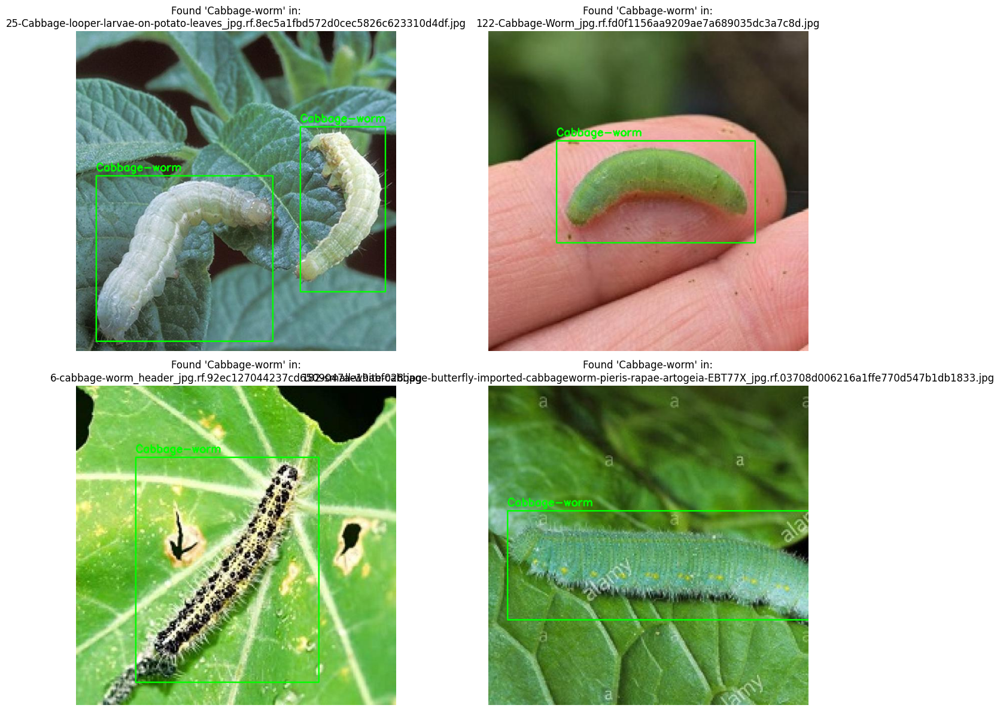

In [ ]:
#@title 2: Visualize Images for a Specific Label

import os
import glob
import random
import xml.etree.ElementTree as ET
import cv2
import matplotlib.pyplot as plt

TARGET_LABEL = "Cabbage-worm"

NUM_IMAGES_TO_SHOW = 4
DATASET_BASE_PATH = "/content/FAW_YOLO_dataset"

print(f"Searching for images containing label: '{TARGET_LABEL}'")

folders_to_search = [
    os.path.join(DATASET_BASE_PATH, "train"),
    os.path.join(DATASET_BASE_PATH, "validation")
]
xmls_with_target = []

for folder in folders_to_search:
    print(f"Searching in: {folder}...")
    xml_files = glob.glob(os.path.join(folder, "*.xml"))
    if not xml_files: continue

    for xml_file in xml_files:
        try:
            tree = ET.parse(xml_file)
            root = tree.getroot()
            for member in root.findall('object'):
                if member.find('name').text == TARGET_LABEL:
                    xmls_with_target.append(xml_file)
                    break
        except Exception:
            continue

if not xmls_with_target:
    print(f"\nNo images found in the dataset with the label '{TARGET_LABEL}'.")
else:
    print(f"\nFound {len(xmls_with_target)} images containing '{TARGET_LABEL}'. Showing {NUM_IMAGES_TO_SHOW} random samples")

    fig_cols = 2
    fig_rows = (NUM_IMAGES_TO_SHOW + fig_cols - 1) // fig_cols
    plt.figure(figsize=(15, 6 * fig_rows))

    random_samples = random.sample(xmls_with_target, min(len(xmls_with_target), NUM_IMAGES_TO_SHOW))

    for i, xml_file in enumerate(random_samples):
        try:
            tree = ET.parse(xml_file)
            root = tree.getroot()

            image_folder = os.path.dirname(xml_file)
            filename_node = root.find('filename')
            image_name = filename_node.text if filename_node is not None else (os.path.splitext(os.path.basename(xml_file))[0] + '.jpg')
            image_path = os.path.join(image_folder, image_name)

            if not os.path.exists(image_path):
                base_image_path = os.path.join(image_folder, os.path.splitext(image_name)[0])
                for ext in ['.jpeg', '.png', '.JPG', '.PNG', '.JPEG']:
                    if os.path.exists(base_image_path + ext): image_path = base_image_path + ext; break
            if not os.path.exists(image_path): continue

            image = cv2.imread(image_path)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            for member in root.findall('object'):
                class_name = member.find('name').text
                bndbox = member.find('bndbox')
                xmin, ymin, xmax, ymax = (int(bndbox.find(tag).text) for tag in ['xmin', 'ymin', 'xmax', 'ymax'])

                color = (0, 255, 0) if class_name == TARGET_LABEL else (255, 0, 0)

                cv2.rectangle(image_rgb, (xmin, ymin), (xmax, ymax), color, 2)
                cv2.putText(image_rgb, class_name, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

            plt.subplot(fig_rows, fig_cols, i + 1)
            plt.imshow(image_rgb)
            plt.title(f"Found '{TARGET_LABEL}' in:\n{os.path.basename(image_path)}")
            plt.axis('off')

        except Exception as e:
            print(f"  Error processing {xml_file}: {e}")

    plt.tight_layout()
    plt.show()

This is the most important data engineering script of the entire project. After identifying the "***23-label mess***," this code block is the solution that executes our "***1-Class Strategy***." It acts as a data 'assembly line' that converts our messy, ***13,000***-file raw dataset into a clean, simple, and organized dataset ready for training.

This script performs three critical jobs simultaneously:

***Filter & Merge (The class_mapping):***

It defines our strategy. The class_mapping dictionary instructs the script to merge all 18 "armyworm" variations (like 'Plaga', 'armWorm', etc.) into the single Class ID 0. It also instructs the script to exclude (skip) the 5 "junk" labels (like 'Cabbage-worm', 'unkown') we identified.

***Reformat (The convert_xml_to_yolo function):***

This function performs the technical conversion. The original .xml files use "pixel" coordinates (e.g., xmin=50, xmax=150). The YOLO toolkit requires a "normalized, centered" format (e.g., x_center=0.3, width_norm=0.1). This function reads the old coordinates, does the math, and writes the new coordinates in .txt files.

**Handle "Negative" Images:**

This is a key insight. What about an image that only contained a 'Cabbage-worm'? Our script is smart. It throws away the "junk" label and creates a completely empty .txt file for that image. This is crucial for training, as it teaches the model what isn't a Fall Armyworm **(e.g., an empty leaf)**, which directly reduces "ghost" detections **(False Positives)**.

The script runs this entire process for both the train and validation sets, creating our new, clean **faw_yolo_dataset_final_1class folder.** The final !ls commands verify that the number of images and new label files match perfectly.

In [ ]:
#@title 2.2  Convert XML to YOLO (1-Class Model, 5 Exclusions)

import os
import glob
import xml.etree.ElementTree as ET
from tqdm.notebook import tqdm
import shutil

print("Starting XML to YOLO Conversion (1-Class Model, 5 Exclusions)")

class_mapping = {

    '1': 0,
    '2': 0,
    'Armyworm': 0,
    'Armyworm_damage': 0,
    'Fall-Armyworm': 0,
    'Fall-armyworm': 0,
    'Maize-fall-armyworm': 0,
    'Plaga': 0,
    'Worms': 0,
    'armWorm': 0,
    'army worm adult': 0,
    'armyWorm': 0,
    'armyworm': 0,
    'fall-armyworm': 0,
    'fallarmyworm': 0,
    'pest': 0,
    'pest-armyworm': 0,
    'worm': 0

}

final_class_names = ['FallArmyworm']
print(f"Using 1-Class mapping (ID 0='{final_class_names[0]}')")
print("Skipping labels: Cabbage-worm, Corn-earworm, Cutworm, -, unkown")

SOURCE_DATA_PATH = "/content/FAW_YOLO_dataset"

YOLO_DATASET_PATH = "/content/faw_yolo_dataset_final_1class"

if os.path.exists(YOLO_DATASET_PATH):
    print(f"Removing existing output directory: {YOLO_DATASET_PATH}")
    shutil.rmtree(YOLO_DATASET_PATH)
os.makedirs(os.path.join(YOLO_DATASET_PATH, "images", "train"), exist_ok=True)
os.makedirs(os.path.join(YOLO_DATASET_PATH, "images", "val"), exist_ok=True)
os.makedirs(os.path.join(YOLO_DATASET_PATH, "labels", "train"), exist_ok=True)
os.makedirs(os.path.join(YOLO_DATASET_PATH, "labels", "val"), exist_ok=True)
print(f"Created fresh output structure at: {YOLO_DATASET_PATH}")


def convert_xml_to_yolo(xml_file_path, output_label_path, class_map):
    """Converts a single XML file to YOLO format."""
    try:
        tree = ET.parse(xml_file_path)
        root = tree.getroot()
        size_node = root.find('size')
        if size_node is None: return False, False
        img_width = int(size_node.find('width').text); img_height = int(size_node.find('height').text)
        if img_width <= 0 or img_height <= 0: return False, False
        yolo_annotations = []; objects_found_in_xml = False; valid_objects_written = False
        for member in root.findall('object'):
            objects_found_in_xml = True; class_name = member.find('name').text

            if class_name not in class_map:
                continue
            class_id = class_map[class_name]; bndbox = member.find('bndbox')
            try: xmin, ymin, xmax, ymax = int(bndbox.find('xmin').text), int(bndbox.find('ymin').text), int(bndbox.find('xmax').text), int(bndbox.find('ymax').text)
            except AttributeError: continue
            xmin, ymin, xmax, ymax = max(0, xmin), max(0, ymin), min(img_width - 1, xmax), min(img_height - 1, ymax)
            box_width = xmax - xmin; box_height = ymax - ymin
            if box_width <= 0 or box_height <= 0: continue
            x_center = (xmin + box_width / 2) / img_width; y_center = (ymin + box_height / 2) / img_height
            width_norm = box_width / img_width; height_norm = box_height / img_height
            x_center, y_center, width_norm, height_norm = max(0.0, min(1.0, x_center)), max(0.0, min(1.0, y_center)), max(0.0, min(1.0, width_norm)), max(0.0, min(1.0, height_norm))
            yolo_annotations.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width_norm:.6f} {height_norm:.6f}"); valid_objects_written = True
        if objects_found_in_xml:

            with open(output_label_path, 'w') as f: f.write("\n".join(yolo_annotations))
            return True, valid_objects_written
        else: return False, False
    except ET.ParseError: return False, False
    except Exception as e: print(f" Error processing {os.path.basename(xml_file_path)}: {e}"); return False, False

processed_count = {'train': 0, 'val': 0}; skipped_count = {'train': 0, 'val': 0}
images_copied = {'train': 0, 'val': 0}; labels_created = {'train': 0, 'val': 0}
labels_with_valid_objects = {'train': 0, 'val': 0}

for split in ['train', 'validation']:
    print(f"\n--- Processing '{split}' set ---")
    output_split_name = 'val' if split == 'validation' else 'train'
    source_folder = os.path.join(SOURCE_DATA_PATH, split)
    image_dest_folder = os.path.join(YOLO_DATASET_PATH, "images", output_split_name)
    label_dest_folder = os.path.join(YOLO_DATASET_PATH, "labels", output_split_name)
    xml_files = glob.glob(os.path.join(source_folder, '*.xml'))
    if not xml_files: print(f"  No XML files found in {source_folder}"); continue

    for xml_file in tqdm(xml_files, desc=f"Converting {split} XMLs"):
        base_filename = os.path.splitext(os.path.basename(xml_file))[0]
        output_txt_path = os.path.join(label_dest_folder, base_filename + '.txt')
        processed, found_valid_objects = convert_xml_to_yolo(xml_file, output_txt_path, class_mapping)
        if processed:
            processed_count[output_split_name] += 1; labels_created[output_split_name] += 1
            if found_valid_objects: labels_with_valid_objects[output_split_name] += 1
            image_copied_flag = False
            for ext in ['.jpg', '.jpeg', '.png']:
                img_file = os.path.join(source_folder, base_filename + ext)
                if os.path.exists(img_file):
                    _, source_ext = os.path.splitext(img_file); img_dest_path = os.path.join(image_dest_folder, base_filename + source_ext)
                    try: shutil.copy2(img_file, img_dest_path); image_copied_flag = True; images_copied[output_split_name] += 1; break
                    except Exception as copy_e: break
            if not image_copied_flag:
                 if os.path.exists(output_txt_path): os.remove(output_txt_path)
                 labels_created[output_split_name] -= 1
                 if found_valid_objects: labels_with_valid_objects[output_split_name] -=1
                 processed_count[output_split_name] -= 1; skipped_count[output_split_name] += 1
        else: skipped_count[output_split_name] += 1

print("\nConversion Summary: ")
print(f"Train set: {processed_count['train']} XMLs processed, {skipped_count['train']} skipped.")
print(f"  - Images copied: {images_copied['train']}")
print(f"  - Label files created: {labels_created['train']}")
print(f"  - Label files with valid objects (FAW): {labels_with_valid_objects['train']}")
print(f"Validation set: {processed_count['val']} XMLs processed, {skipped_count['val']} skipped.")
print(f"  - Images copied: {images_copied['val']}")
print(f"  - Label files created: {labels_created['val']}")
print(f"  - Label files with valid objects (FAW): {labels_with_valid_objects['val']}")
print(f"YOLO formatted data saved to: {YOLO_DATASET_PATH}")

print("\n--- Verifying Output File Counts ---")
!echo "Train images:" && ls -1 {YOLO_DATASET_PATH}/images/train | wc -l
!echo "Train labels:" && ls -1 {YOLO_DATASET_PATH}/labels/train | wc -l
!echo "Val images:" && ls -1 {YOLO_DATASET_PATH}/images/val | wc -l
!echo "Val labels:" && ls -1 {YOLO_DATASET_PATH}/labels/val | wc -l

Starting XML to YOLO Conversion (1-Class Model, 5 Exclusions)
Using 1-Class mapping (ID 0='FallArmyworm')
Skipping labels: Cabbage-worm, Corn-earworm, Cutworm, -, unkown
Created fresh output structure at: /content/faw_yolo_dataset_final_1class

--- Processing 'train' set ---


Converting train XMLs:   0%|          | 0/11232 [00:00<?, ?it/s]


--- Processing 'validation' set ---


Converting validation XMLs:   0%|          | 0/1889 [00:00<?, ?it/s]


Conversion Summary: 
Train set: 11222 XMLs processed, 10 skipped.
  - Images copied: 11222
  - Label files created: 11222
  - Label files with valid objects (FAW): 10869
Validation set: 1889 XMLs processed, 0 skipped.
  - Images copied: 1889
  - Label files created: 1889
  - Label files with valid objects (FAW): 1847
YOLO formatted data saved to: /content/faw_yolo_dataset_final_1class

--- Verifying Output File Counts ---
Train images:
11222
Train labels:
11222
Val images:
1889
Val labels:
1889


We have now successfully created a perfectly clean, organized, and correctly formatted dataset. However, a final step is required before we can train.

**The Problem:**

The Ultralytics training engine is a separate tool. It has no way of knowing:

Where our new faw_yolo_dataset_final_1class folder is located.

Which subfolders contain the train vs. validation images.

Most importantly, what the class ID 0 (which we created in our .txt files) actually means.



**The Solution:**

This script creates a single, simple configuration file called faw_dataset_final_1class.yaml to act as the "master instruction sheet" for our entire dataset.



Using the PyYAML library, we define a Python dictionary **(dataset_config)** that contains these three key pieces of information:


**path:** The absolute path to our main dataset folder.

**train / val**: The relative paths to the training and validation image subfolders.

**names:** The "dictionary" that maps our numerical ID (0) to its human-readable name ('FallArmyworm').


The script then writes this configuration to the .yaml file and uses !cat to print its contents, allowing us to verify that our "instruction manual" is correct before we hand it to the model for training.

In [ ]:
#@title Create dataset.yaml (1-Class FAW-Only Model)

import yaml
import os

print("Creating faw_dataset_final_1class.yaml")

YOLO_DATASET_PATH = "/content/faw_yolo_dataset_final_1class"

final_class_names = ['FallArmyworm']

dataset_config = {
    'path': YOLO_DATASET_PATH,
    'train': 'images/train',
    'val': 'images/val',
    'names': {i: name for i, name in enumerate(final_class_names)}
}

YAML_OUTPUT_PATH = "/content/faw_dataset_final_1class.yaml"

try:
    with open(YAML_OUTPUT_PATH, 'w') as f:
        yaml.dump(dataset_config, f, sort_keys=False, default_flow_style=None)
    print(f"✅ Successfully created {YAML_OUTPUT_PATH}")

    print("\nContent of faw_dataset_final_1class.yaml: ")
    !cat {YAML_OUTPUT_PATH}

except Exception as e:
    print(f"Error creating YAML file: {e}")

Creating faw_dataset_final_1class.yaml
✅ Successfully created /content/faw_dataset_final_1class.yaml

Content of faw_dataset_final_1class.yaml: 
path: /content/faw_yolo_dataset_final_1class
train: images/train
val: images/val
names: {0: FallArmyworm}


Before we begin training, this code block performs a pre-flight check for an optional, but powerful, library called albumentations.

The ultralytics training engine is designed to be highly flexible. It has its own excellent, built-in data augmentation capabilities **(like flipping, rotating, and color shifts)**. However, it is also smart enough to automatically detect and integrate the albumentations library if it is present in the environment.

Why this check is useful: If albumentations is installed, our model will be trained with a wider and more advanced set of augmentations **(e.g., Blur, Sharpen, Noise).** This can help create a more robust and resilient model that performs better on new, unseen images that might be blurry or have different visual properties.

This is not an error-checking step. If the library isn't found, the code simply notifies us, and the ultralytics trainer will proceed normally using its standard set of augmentations.

In [ ]:
#@title Check if Albumentations is Installed
try:
    import albumentations
    print(f"✅ Albumentations is installed (version {albumentations.__version__}).")
    print("   Ultralytics will automatically use it for extra augmentations during training.")
except ModuleNotFoundError:

    print("Albumentations is NOT installed.")
    print("   Ultralytics will still use its standard built-in augmentations.")
    print("   You can install it with: !pip install -q albumentations")
except Exception as e:

    print(f"An unexpected error occurred: {e}")

✅ Albumentations is installed (version 2.0.8).
   Ultralytics will automatically use it for extra augmentations during training.


This code block is the core of the entire project, where all our data preparation pays off. This single block initializes the model and launches the **50-epoch** training run.

1. Model Initialization **(YOLO("yolov11s.pt"))** We load the yolov11s.pt model. This was a deliberate choice, as the "small" model provides the perfect balance between the nano model's high speed and a larger model's accuracy, which is ideal for our project goals.


This is a **Transfer Learning approach**. The yolov11s.pt file is pre-trained on the large **80-class COCO dataset** , meaning the model already has a sophisticated understanding of basic shapes, edges, and textures. Our job is not to teach it how to see, but to **"fine-tune"** it to find our one specific class: '**FallArmyworm**'.



2. Training Execution (**model.train(...)**) We then configure and launch the main training process  with these key parameters:



*   **data....**: it points to our faw_dataset_final_1class.yaml file, which is the "master instruction manual" we just created.
*   **epochs=50:** Instructs the model to run 50 full "drills," or passes, over the entire 11,222-image training dataset.

*   **project=... & name=...**: Tells the trainer to save all results **(graphs, checkpoints)** to our permanent runs folder in Google Drive, which we created in Phase 1.5.


*   **device=0:** Explicitly assigns this computationally heavy process to our verified GPU **(CUDA:0)** to ensure it runs thousands of times faster than on a CPU




In [ ]:
#@title 3.1 & 3.2 (Final Training): Load YOLOv11s & Train 50 Epochs

#from ultralytics import YOLO
#import os

#print("--- Initializing YOLOv11s model ---")
#model = YOLO("yolo11s.pt")
#print("✅ Model initialized.")

#DATASET_YAML_PATH = "/content/faw_dataset_final_1class.yaml"

#NUM_EPOCHS = 50
#IMAGE_SIZE = 640
#BATCH_SIZE = 16
#GDRIVE_PROJECT_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)"
#RUN_NAME = 'yolov11s_faw_1class_50epoch_run'
#OUTPUT_DIR = os.path.join(GDRIVE_PROJECT_PATH, "runs")
#os.makedirs(os.path.join(OUTPUT_DIR, RUN_NAME), exist_ok=True)

#print("\n--- Starting Final Training (1-Class Model, 50 Epochs) ---")
#print(f"Model: yolo11s.pt")
#print(f"Dataset config: {DATASET_YAML_PATH}")
#print(f"Epochs: {NUM_EPOCHS}")
#print(f"Image size: {IMAGE_SIZE}")
#print(f"Batch size: {BATCH_SIZE}")
#print(f"Output directory: {OUTPUT_DIR}/{RUN_NAME}")

#try:
    #results = model.train(
        #data=DATASET_YAML_PATH,
        #epochs=NUM_EPOCHS,
        #imgsz=IMAGE_SIZE,
        #batch=BATCH_SIZE,
        #project=OUTPUT_DIR,
        #name=RUN_NAME,
        #device=0,
        #exist_ok=True
   # )
    #print("\n--- Training Completed ---")

#except Exception as e:
    #print(f"\n--- ERROR during training ---")
    #print(e)
    #!nvidia-smi

In [ ]:
#@title 3.4: Train 20 Additional Epochs

#from ultralytics import YOLO
#import os

#print("--- Initializing YOLOv11s model from previous checkpoint ---")

#GDRIVE_PROJECT_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)"

#PREVIOUS_RUN_NAME = 'yolov11s_faw_1class_50epoch_run'

#OUTPUT_DIR = os.path.join(GDRIVE_PROJECT_PATH, "runs")

#CHECKPOINT_TO_LOAD = os.path.join(OUTPUT_DIR, PREVIOUS_RUN_NAME, 'weights', 'best.pt')

# --- 2. Define NEW Training Parameters ---
# The name for the NEW "nearby" folder
#NEW_RUN_NAME = 'yolov11s_faw_1class_extra20' # <-- This creates the new folder
# The dataset YAML (must exist in /content/)
#DATASET_YAML_PATH = "/content/faw_dataset_final_1class.yaml"
#NUM_EXTRA_EPOCHS = 20
#IMAGE_SIZE = 640
#BATCH_SIZE = 16

# Check if the checkpoint exists
#if os.path.exists(CHECKPOINT_TO_LOAD):
    #print(f"Found checkpoint to load at: {CHECKPOINT_TO_LOAD}")

    #model = YOLO(CHECKPOINT_TO_LOAD)
   # print("✅ Model loaded from best checkpoint.")

    #print("\n--- Starting New Training Run (20 extra epochs) ---")
    #print(f"Dataset config: {DATASET_YAML_PATH}")
    #print(f"Targeting {NUM_EXTRA_EPOCHS} additional epochs.")
    #print(f"New output directory: {OUTPUT_DIR}/{NEW_RUN_NAME}")

   ### import torch
   # device_to_use = 0 if torch.cuda.is_available() else 'cpu'
   # print(f"Attempting to use device: {device_to_use}")

    #try:
        # We call train() normally, NOT with resume=True.
        # This starts a new run in a new folder,
        # using the loaded weights as the starting point.
        #results = model.train(
            #data=DATASET_YAML_PATH,
           # epochs=NUM_EXTRA_EPOCHS, # Train for only 20 *new* epochs
           # imgsz=IMAGE_SIZE,
           # batch=BATCH_SIZE,
          #  project=OUTPUT_DIR,
          #  name=NEW_RUN_NAME,  # Save to the new folder name
           # device=device_to_use,
           # exist_ok=False # Prevent overwriting this new run
      #  )
       # print("\n--- Additional Training Completed ---")

   # except Exception as e:
     #   print(f"\n--- ERROR during training ---")
       # print(e)
#else:
   # print(f"ERROR: Cannot start. Checkpoint not found at {CHECKPOINT_TO_LOAD}")
   # print("   Please ensure the path and PREVIOUS_RUN_NAME are correct.")

--- Loading Results from Google Drive ---
Results folder: /content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/runs/yolov11s_faw_1class_50epoch_run
--- Displaying Result Images ---


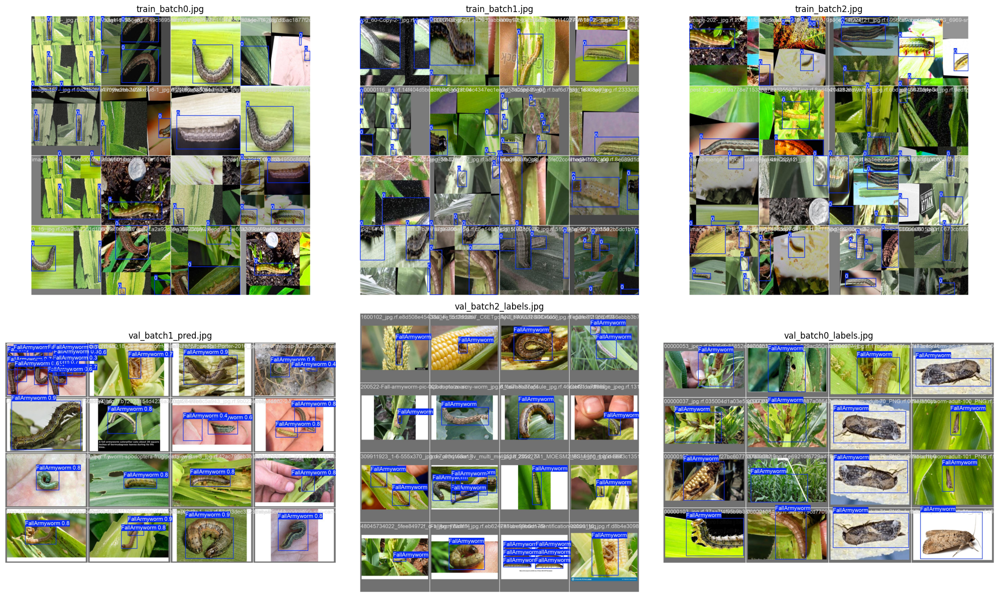

In [ ]:
#@title 4.1: Visualize All Training Result Images (1)

import matplotlib.pyplot as plt
import cv2
import os

print("--- Loading Results from Google Drive ---")

GDRIVE_PROJECT_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)"
RUN_NAME = 'yolov11s_faw_1class_50epoch_run'
RESULTS_DIR = os.path.join(GDRIVE_PROJECT_PATH, "runs", RUN_NAME)

print(f"Results folder: {RESULTS_DIR}")

image_files = [
    "train_batch0.jpg",
    "train_batch1.jpg",
    "train_batch2.jpg",
    "val_batch1_pred.jpg",
    "val_batch2_labels.jpg",
    "val_batch0_labels.jpg"
]


fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

print("--- Displaying Result Images ---")

for i, filename in enumerate(image_files):
    image_path = os.path.join(RESULTS_DIR, filename)
    axes[i].set_title(filename)
    axes[i].axis('off')

    if os.path.exists(image_path):
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img_rgb)
    else:
        axes[i].text(0.5, 0.5, 'File Not Found',
                     horizontalalignment='center',
                     verticalalignment='center',
                     transform=axes[i].transAxes,
                     fontsize=14, color='red')

plt.tight_layout()
plt.show()

--- Loading Results from Google Drive ---
Results folder: /content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/runs/yolov11s_faw_1class_50epoch_run
--- Displaying Result Images ---


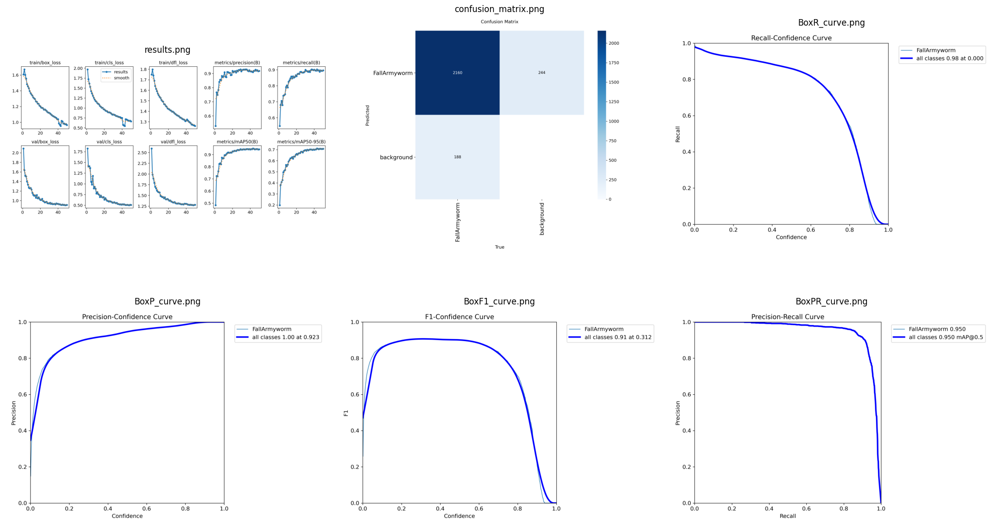

In [ ]:
#@title 4.1: Visualize All Training Result Images (2)

import matplotlib.pyplot as plt
import cv2
import os

print("--- Loading Results from Google Drive ---")

GDRIVE_PROJECT_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)"
RUN_NAME = 'yolov11s_faw_1class_50epoch_run'
RESULTS_DIR = os.path.join(GDRIVE_PROJECT_PATH, "runs", RUN_NAME)

print(f"Results folder: {RESULTS_DIR}")

image_files = [
    "results.png",
    "confusion_matrix.png",
    "BoxR_curve.png",
    "BoxP_curve.png",
    "BoxF1_curve.png",
    "BoxPR_curve.png"
]


fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

print("--- Displaying Result Images ---")

for i, filename in enumerate(image_files):
    image_path = os.path.join(RESULTS_DIR, filename)

    axes[i].set_title(filename)
    axes[i].axis('off')

    if os.path.exists(image_path):
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img_rgb)
    else:
        axes[i].text(0.5, 0.5, 'File Not Found',
                     horizontalalignment='center',
                     verticalalignment='center',
                     transform=axes[i].transAxes,
                     fontsize=14, color='red')

plt.tight_layout()
plt.show()

This code block executes the final and most critical deliverable of our project: exporting the trained model into a deployable format.


The raw output from the ultralytics trainer is a .pt file **(e.g., best.pt)**, which is a PyTorch-specific checkpoint. This format is excellent for training but not ideal for deployment across different platforms.

**The Solution:**

ONNX Our project requires the model to be in the ONNX **(Open Neural Network Exchange)** format. ONNX is a universal, open-source standard that allows AI models to be used on a wide variety of hardware and software **(e.g., mobile devices, drones, web servers)**, regardless of the original training framework.

This script performs the following steps:

*   **Locate Best Checkpoint:** It defines the path to our best.pt file, which is the version of the model that achieved the highest accuracy during our 50-epoch validation.
*   **Load Model:** It initializes a new YOLO object using this best.pt file, loading our trained "brain" into memory.

*   **Export:** It calls the built-in model.export(format='onnx') function. This command handles the complex conversion process, translating the PyTorch model into the ONNX standard.
*   **Save Final Deliverable:** It then moves the resulting model.onnx file to our main project folder in Google Drive, making it our final, portable, and deployment-ready deliverable.





In [ ]:
#@title 5.1: Export Best Model to ONNX Format

#from ultralytics import YOLO
#import os
#import shutil

#print("--- Starting ONNX Export ---")

#GDRIVE_PROJECT_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)"
#RUN_NAME = 'yolov11s_faw_1class_50epoch_run'
#BEST_CHECKPOINT_PATH = os.path.join(GDRIVE_PROJECT_PATH, "runs", RUN_NAME, 'weights', 'best.pt')
#FINAL_ONNX_MODEL_PATH = os.path.join(GDRIVE_PROJECT_PATH, "model.onnx")

#if os.path.exists(BEST_CHECKPOINT_PATH):
    #print(f"Found best checkpoint at: {BEST_CHECKPOINT_PATH}")

    #model = YOLO(BEST_CHECKPOINT_PATH)
    #print("✅ Model loaded from best checkpoint.")

    #try:
        #print("--- Exporting to ONNX format... ---")

        #onnx_path = model.export(format='onnx', imgsz=640, opset=12)

        #print(f"Successfully exported to: {onnx_path}")

        #shutil.move(onnx_path, FINAL_ONNX_MODEL_PATH)

        #print(f"\n--- ✅ Success! ---")
        #print(f"Final ONNX model saved to: {FINAL_ONNX_MODEL_PATH}")

       # !ls -lh {FINAL_ONNX_MODEL_PATH}

    #except Exception as e:
        #print(f"\nERROR during ONNX export ---")
        #print(e)
#else:
    #print(f"ERROR: Cannot export. Checkpoint not found at {BEST_CHECKPOINT_PATH}")
    #print("   Please ensure the path and RUN_NAME are correct.")

This code block represents the final "pass/fail" test for our project. Until now, our model has only been validated on static images from the validation set. Now, we must test its performance in a dynamic, real-world scenario using video data it has never seen before.

This is also the definitive test of our .onnx file. It confirms our final deliverable is a functional, deployable model.

The script executes the following logic:

*   **Pre-flight Check:** It first verifies that both our model.onnx file (exported in the previous step) and our TEST_VIDEO_DIR (cloned in Phase 2.1) actually exist.
*   **Load ONNX Model:** It instantiates the YOLO model, but this time, it loads directly from our exported FINAL_ONNX_MODEL_PATH. This proves our .onnx file is valid.


*   **Run Inference (Prediction):** It runs model.predict() on the entire folder of test videos. Because YOLO is so fast, it can process the video frame-by-frame in near real-time.


*   **Save Results:** The save=True parameter is key. It instructs ultralytics to save a new copy of each video, with our model's bounding boxes and confidence scores drawn directly onto the frames


*   **Confirm Output:** The results are saved to our permanent Google Drive runs folder, and !ls -lh confirms the processed videos now exist.

In [ ]:
#@title 6.1: Run Inference on Test Videos with ONNX Model

from ultralytics import YOLO
import os
import glob

print("Starting Final Test on Video Dataset")

FINAL_ONNX_MODEL_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/model.onnx"
TEST_VIDEO_DIR = "/content/FAW_YOLO_dataset/test"
VIDEO_OUTPUT_DIR = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/runs/final_video_test"
RUN_NAME = 'onnx_run1'

if not os.path.exists(TEST_VIDEO_DIR):
    print(f"ERROR: Test video folder not found at {TEST_VIDEO_DIR}")
    print("   Please re-run 'Cell 2.1: Clone Data from GitHub' to download your dataset.")
elif not os.path.exists(FINAL_ONNX_MODEL_PATH):
    print(f"ERROR: Final 'model.onnx' not found at {FINAL_ONNX_MODEL_PATH}")
    print("   Please re-run 'Cell 5.1: Export Best Model to ONNX' first.")
else:
    print(f"Found test video directory: {TEST_VIDEO_DIR}")
    print(f"Found ONNX model: {FINAL_ONNX_MODEL_PATH}")

    try:
        model = YOLO(FINAL_ONNX_MODEL_PATH, task='detect')
        print("✅ ONNX model loaded successfully.")
        print("\n--- Starting video inference... ---")
        results = model.predict(
            source=TEST_VIDEO_DIR,
            save=True,
            project=VIDEO_OUTPUT_DIR,
            name=RUN_NAME,
            exist_ok=True
        )
        print("\n--- ✅ Video Inference Complete ---")

        output_folder = os.path.join(VIDEO_OUTPUT_DIR, RUN_NAME)
        print(f"\nYour processed videos (with bounding boxes) are saved in:")
        print(output_folder)

        !ls -lh "{output_folder}"

    except Exception as e:
        print(f"\nERROR during video inference ---")
        print(e)

Starting Final Test on Video Dataset
Found test video directory: /content/FAW_YOLO_dataset/test
Found ONNX model: /content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/model.onnx
✅ ONNX model loaded successfully.

--- Starting video inference... ---
Loading /content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)/model.onnx for ONNX Runtime inference...
requirements: Ultralytics requirements ['onnx', 'onnxruntime'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 4.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

Using ONNX Runtime 1.24.0.dev20251031003 CPUExecutionProvider

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  

In the previous step, our **model.predict()** function successfully ran inference and saved the processed videos **(with bounding boxes)** to our Google Drive. However, those videos might be saved in formats **(like .avi)** that cannot be embedded and played directly within a Google Colab notebook.

This code block is the final step, designed to display our results visually for this demonstration.


*   **Locate Processed Video:** It searches our Google Drive runs folder for the newly created video files.


*   **Convert for Colab:** It uses the powerful ffmpeg utility to convert the original output video into the standard libx264 (.mp4) codec. This is the format that Google Colab can reliably embed and play.


*   **Display Result:** Finally, it uses IPython.display to embed and show the final, converted video directly in our notebook. This allows us to visually confirm, in real-time, that our exported .onnx model is successfully identifying and tracking the Fall Armyworm on unseen video data.










In [ ]:
#@title 6.2 Convert and Display Test Video

from IPython.display import Video, display
import glob
import os

GDRIVE_PROJECT_PATH = "/content/drive/MyDrive/FAW_Capstone_YOLO(11-4s)"
VIDEO_RUN_NAME = 'onnx_run1'
VIDEO_OUTPUT_DIR = os.path.join(GDRIVE_PROJECT_PATH, "runs", "final_video_test", VIDEO_RUN_NAME)

print(f"--- Searching for processed videos in: {VIDEO_OUTPUT_DIR} ---")

video_files = glob.glob(os.path.join(VIDEO_OUTPUT_DIR, "*.mp4")) + \
              glob.glob(os.path.join(VIDEO_OUTPUT_DIR, "*.avi")) + \
              glob.glob(os.path.join(VIDEO_OUTPUT_DIR, "*.mov"))

if not video_files:
    print(f"ERROR: No video files (.mp4, .avi, .mov) found in {VIDEO_OUTPUT_DIR}")
else:
    original_video_path = video_files[0]
    converted_video_path = os.path.join(VIDEO_OUTPUT_DIR, "video_converted_for_colab.mp4")

    print(f"Found video: {os.path.basename(original_video_path)}")
    print("--- Converting video to playable MP4 format (this may take a minute)... ---")

    !ffmpeg -i "{original_video_path}" -vcodec libx264 -y "{converted_video_path}" -hide_banner -loglevel error

    print(f"✅ Conversion complete. Displaying: {os.path.basename(converted_video_path)}")

    if os.path.exists(converted_video_path):
        display(Video(converted_video_path, embed=True, width=600))
    else:
        print("ERROR: Video conversion failed.")